<a href="https://colab.research.google.com/github/victordomke/TCC-CNN-Flowpack/blob/main/tcc_vrd_flowpack_versao_final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# CNN Intimo


---




In [ ]:
#hide
#skip
! [ -e /content ] && pip install -Uqq fastai  # upgrade fastai on colab

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
from fastai.vision.all import *

In [ ]:
#path_demaq = Path('/content/drive/Shareddrives/TCC-domke/dataset/demaquilante')

path_inti = Path('/content/drive/Shareddrives/TCC-domke/TCC_Domke(documentos cotton)/dataset/intimo')

#path_wipe = Path('/content/drive/Shareddrives/TCC-domke/dataset/wipe-home')

In [ ]:
files_inti = get_image_files(path_inti)
len(files_inti)


91

In [ ]:
inti = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items = get_image_files,
    splitter= RandomSplitter(valid_pct=0.3, seed=42),
    get_y= parent_label,
    item_tfms=Resize(128),
    batch_tfms=aug_transforms(max_rotate=30, pad_mode=PadMode.Zeros))
dls = inti.dataloaders(path_inti)
avg = 'macro'
metricas = [accuracy, Precision(average=avg), Recall(average=avg), F1Score(average=avg)]
len(dls.train_ds), len(dls.valid_ds)

(64, 27)

In [ ]:
#dls.show_batch()

#  Treinamento Intimo

---



In [ ]:
learn_resnet101 = cnn_learner(dls, resnet101, metrics=metricas)

/usr/local/lib/python3.7/dist-packages/fastai/vision/learner.py:284: UserWarning: `cnn_learner` has been renamed to `vision_learner` -- please update your code
  warn("`cnn_learner` has been renamed to `vision_learner` -- please update your code")
/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and will be removed in 0.15, "
/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=ResNet101_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet101_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet101-6

  0%|          | 0.00/171M [00:00<?, ?B/s]

In [ ]:
#learn_resnet18.lr_find()
#learn_resnet34.lr_find()
learn_resnet101.lr_find()

KeyboardInterrupt: ignored

In [ ]:
#learn_resnet18.fine_tune(10, 0.0006)
#learn_resnet34.fine_tune(10, 0.06)
#learn_resnet50.fine_tune(10, 0.0006)
learn_resnet101.fine_tune(30, base_lr=0.0004)

epoch,train_loss,valid_loss,accuracy,precision_score,recall_score,f1_score,time
0,1.610324,1.202855,0.518519,0.535897,0.540476,0.481481,00:40


epoch,train_loss,valid_loss,accuracy,precision_score,recall_score,f1_score,time
0,1.152135,1.121425,0.555556,0.527273,0.564286,0.509231,00:27
1,1.166896,1.027209,0.592593,0.572727,0.605952,0.560635,00:27
2,1.155323,0.913018,0.629630,0.628283,0.647619,0.608254,00:28
3,1.218289,0.811049,0.666667,0.648148,0.671429,0.637363,00:26
4,1.153072,0.707064,0.703704,0.696866,0.695238,0.667209,00:27
5,1.046346,0.582096,0.740741,0.722507,0.719048,0.691901,00:26
6,0.972377,0.499040,0.888889,0.841270,0.850000,0.842424,00:28
7,0.899878,0.408592,0.888889,0.841270,0.850000,0.842424,00:27
8,0.825857,0.355938,0.888889,0.841270,0.850000,0.842424,00:26
9,0.784247,0.316677,0.888889,0.841270,0.850000,0.842424,00:28


KeyboardInterrupt: ignored

In [ ]:
learn_resnet101.export(os.path.abspath('./learn101_inti.pkl'))

## importando o learner intimo

In [ ]:
learner_inti = load_learner('/content/drive/Shareddrives/TCC-domke/dataset/models/learn101_inti.pkl')
print('model is load!')
img_inti_OK = PILImage.create('/content/drive/Shareddrives/TCC-domke/dataset/intimo/inti-OK/inti-OK_15.jpg')

model is load!


predição de uma imagem

In [ ]:
learner_inti.predict(img_inti_OK)
#learner_inti.predict(img_inti_falha_tampa)
#learner_inti.predict(img_inti_lenco_fora)

('inti-OK', TensorBase(0), TensorBase([9.9958e-01, 1.5359e-04, 2.6159e-04]))

matriz de confusão

epoch,train_loss,valid_loss,accuracy,precision_score,recall_score,f1_score,time
0,1.758837,1.337149,0.259259,0.400000,0.380952,0.194444,00:31
1,1.556215,1.169671,0.370370,0.409091,0.452381,0.298895,00:30
2,1.539620,1.088668,0.444444,0.416667,0.500000,0.355556,00:29
3,1.499172,1.016711,0.518519,0.376894,0.547619,0.398730,00:29
4,1.398880,0.998760,0.555556,0.407197,0.571429,0.425397,00:29
5,1.308332,0.959410,0.518519,0.366667,0.504762,0.389744,00:29
6,1.239745,0.926830,0.629630,0.426740,0.619048,0.471735,00:29
7,1.177599,0.881905,0.629630,0.426740,0.619048,0.471735,00:29
8,1.123888,0.868734,0.666667,0.437729,0.642857,0.494709,00:29
9,1.044627,0.848316,0.666667,0.437729,0.642857,0.494709,00:29


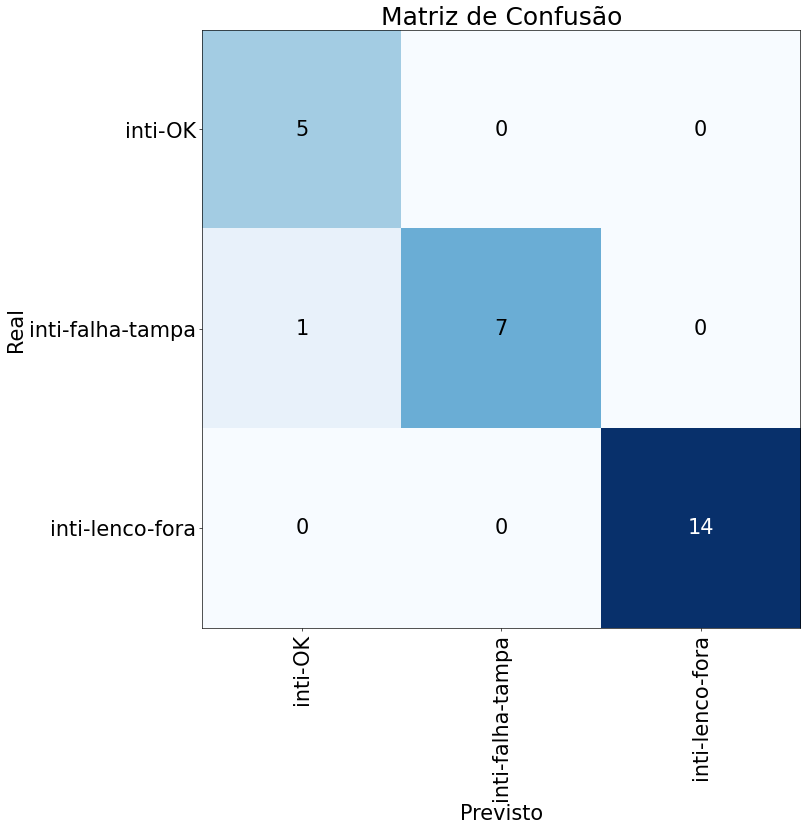

In [ ]:

interp101 = ClassificationInterpretation.from_learner(learn_resnet101)
interp101.plot_confusion_matrix(figsize=(14,14), dpi=60, title='Matriz de Confusão')
plt.ylabel('Real')
plt.xlabel('Previsto')
font = {'size': 25}
plt.rc('font', **font)

mostando os resultados

In [ ]:
#learn_resnet101.show_results()

# CNN Demaquilante


---



In [ ]:
#hide
#skip
! [ -e /content ] && pip install -Uqq fastai  # upgrade fastai on colab

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
from fastai.vision.all import *

In [ ]:
path_demaq = Path('/content/drive/Shareddrives/TCC-domke/dataset/demaq')

#path_inti = Path('/content/drive/Shareddrives/TCC-domke/dataset/intimo')

#path_wipe = Path('/content/drive/Shareddrives/TCC-domke/dataset/wipe-home')

In [ ]:
files_demaq = get_image_files(path_demaq)
len(files_demaq)

#files_inti = get_image_files(path_inti)
#len(files_inti)

#files_wipe = get_image_files(path_wipe)
#len(files_wipe)

166

In [ ]:
demaq = DataBlock(
#inti = DataBlock(
#wipe = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items = get_image_files,
    splitter= RandomSplitter(valid_pct=0.3, seed=42),
    get_y= parent_label,
    item_tfms=Resize(128),
    batch_tfms=aug_transforms(max_rotate=30, pad_mode=PadMode.Zeros))
dls = demaq.dataloaders(path_demaq)
#dls = inti.dataloaders(path_inti)
#dls = wipe.dataloaders(path_wipe)
avg = 'macro'
metricas = [accuracy, Precision(average=avg), Recall(average=avg), F1Score(average=avg)]
len(dls.train_ds), len(dls.valid_ds)

/usr/local/lib/python3.7/dist-packages/torch/_tensor.py:1051: UserWarning: torch.solve is deprecated in favor of torch.linalg.solveand will be removed in a future PyTorch release.
torch.linalg.solve has its arguments reversed and does not return the LU factorization.
To get the LU factorization see torch.lu, which can be used with torch.lu_solve or torch.lu_unpack.
X = torch.solve(B, A).solution
should be replaced with
X = torch.linalg.solve(A, B) (Triggered internally at  ../aten/src/ATen/native/BatchLinearAlgebra.cpp:766.)
  ret = func(*args, **kwargs)


(117, 49)

In [ ]:
#dls.show_batch()

#  Treinamento Demaquilante

---



In [ ]:
#learn_resnet18 = cnn_learner(dls, resnet18, metrics=metricas)
#learn_resnet34 = cnn_learner(dls, resnet34, metrics=metricas)
#learn_resnet50 = cnn_learner(dls, resnet50, metrics=metricas)
learn_resnet101 = cnn_learner(dls, resnet101, metrics=metricas)

SuggestedLRs(valley=0.0004786300996784121)

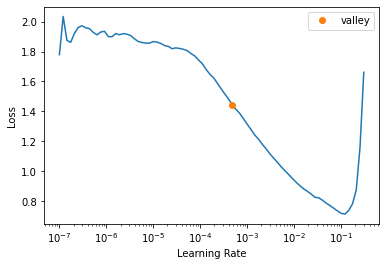

In [ ]:
#learn_resnet18.lr_find()
#learn_resnet34.lr_find()
learn_resnet101.lr_find() #gráfico abaixo

In [ ]:
#learn_resnet18.fine_tune(10, 0.0006)
#learn_resnet34.fine_tune(10, 0.06)
#learn_resnet50.fine_tune(10, 0.0006)
learn_resnet101.fine_tune(50, base_lr=0.0004)

epoch,train_loss,valid_loss,accuracy,precision_score,recall_score,f1_score,time
0,2.232620,3.566563,0.367347,0.222222,0.346667,0.252540,00:11


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


epoch,train_loss,valid_loss,accuracy,precision_score,recall_score,f1_score,time
0,1.913854,3.163975,0.285714,0.226316,0.346667,0.223810,00:09
1,1.832748,2.837367,0.224490,0.196970,0.306667,0.182713,00:08
2,1.959729,2.507442,0.265306,0.251425,0.440000,0.221652,00:08
3,1.901320,2.232196,0.204082,0.248984,0.400000,0.173474,00:08
4,1.815102,1.910321,0.244898,0.301994,0.426667,0.213012,00:08
5,1.778975,1.586185,0.326531,0.604630,0.496842,0.333826,00:08
6,1.703518,1.313188,0.367347,0.495650,0.536140,0.365860,00:08
7,1.585851,1.124263,0.530612,0.616987,0.672281,0.511971,00:08
8,1.504189,1.035415,0.591837,0.667644,0.724912,0.580833,00:09
9,1.436168,1.018353,0.612245,0.681818,0.689123,0.597514,00:08


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Pr

KeyboardInterrupt: ignored

In [ ]:
learn_resnet101.export(os.path.abspath('./learn101_demaq.pkl'))

In [ ]:
learner_demaq = load_learner('/content/drive/Shareddrives/TCC-domke/dataset/models/learn101_demaq.pkl')
print('model is load!')

learner_demaq.dls.train = dls.train
learner_demaq.dls.valid = dls.valid

img_demaq1 = PILImage.create('/content/drive/Shareddrives/TCC-domke/dataset/demaq/demaq-lenco-fora/demaq-lenco-fora_10.jpg')
img_demaq2 = PILImage.create('/content/drive/Shareddrives/TCC-domke/dataset/demaq/demaq-falha-tampa/demaq-falha-tampa_11.jpg')
img_demaq3 = PILImage.create('/content/drive/Shareddrives/TCC-domke/dataset/demaq/demaq-falha-tampa/demaq-falha-tampa_4.jpg')
img_demaq4 = PILImage.create('/content/drive/Shareddrives/TCC-domke/dataset/demaq/demaq-falha-tampa/demaq-falha-tampa_1.jpg')
img_demaq5 = PILImage.create('/content/drive/Shareddrives/TCC-domke/dataset/demaq/demaq-falha-tampa/demaq-falha-tampa_7.jpg')
img_demaq6 = PILImage.create('/content/drive/Shareddrives/TCC-domke/dataset/demaq/demaq-lenco-fora/demaq-lenco-fora_5.jpg')
img_demaq7 = PILImage.create('/content/drive/Shareddrives/TCC-domke/dataset/demaq/demaq-lenco-fora/demaq-lenco-fora_3.jpg')
img_demaq8 = PILImage.create('/content/drive/Shareddrives/TCC-domke/dataset/demaq/demaq-lenco-fora/demaq-lenco-fora_10.jpg')
img_demaq9 = PILImage.create('/content/drive/Shareddrives/TCC-domke/dataset/demaq/demaq-OK/demaq-OK_6.jpg')
img_demaq10 = PILImage.create('/content/drive/Shareddrives/TCC-domke/dataset/demaq/demaq-OK/demaq-OK_3.jpg')


model is load!


In [ ]:
learner_demaq.predict(img_demaq1),learner_demaq.predict(img_demaq2),learner_demaq.predict(img_demaq3),learner_demaq.predict(img_demaq3),learner_demaq.predict(img_demaq4),learner_demaq.predict(img_demaq5),learner_demaq.predict(img_demaq6),learner_demaq.predict(img_demaq7),learner_demaq.predict(img_demaq8),learner_demaq.predict(img_demaq9),learner_demaq.predict(img_demaq10)

(('wipe-OK', TensorBase(0), TensorBase([0.4692, 0.4488, 0.0820])),
 ('wipe-falha-tampa',
  TensorBase(1),
  TensorBase([1.3088e-02, 9.8641e-01, 4.9951e-04])),
 ('wipe-falha-tampa', TensorBase(1), TensorBase([0.0587, 0.9403, 0.0010])),
 ('wipe-falha-tampa', TensorBase(1), TensorBase([0.0587, 0.9403, 0.0010])),
 ('wipe-falha-tampa', TensorBase(1), TensorBase([0.2964, 0.6518, 0.0518])),
 ('wipe-falha-tampa',
  TensorBase(1),
  TensorBase([1.0869e-01, 8.9106e-01, 2.4245e-04])),
 ('wipe-falha-tampa', TensorBase(1), TensorBase([0.0228, 0.9480, 0.0293])),
 ('wipe-OK', TensorBase(0), TensorBase([0.8119, 0.0102, 0.1779])),
 ('wipe-OK', TensorBase(0), TensorBase([0.4692, 0.4488, 0.0820])),
 ('wipe-OK', TensorBase(0), TensorBase([0.7554, 0.0204, 0.2242])),
 ('wipe-OK', TensorBase(0), TensorBase([0.9709, 0.0246, 0.0045])))

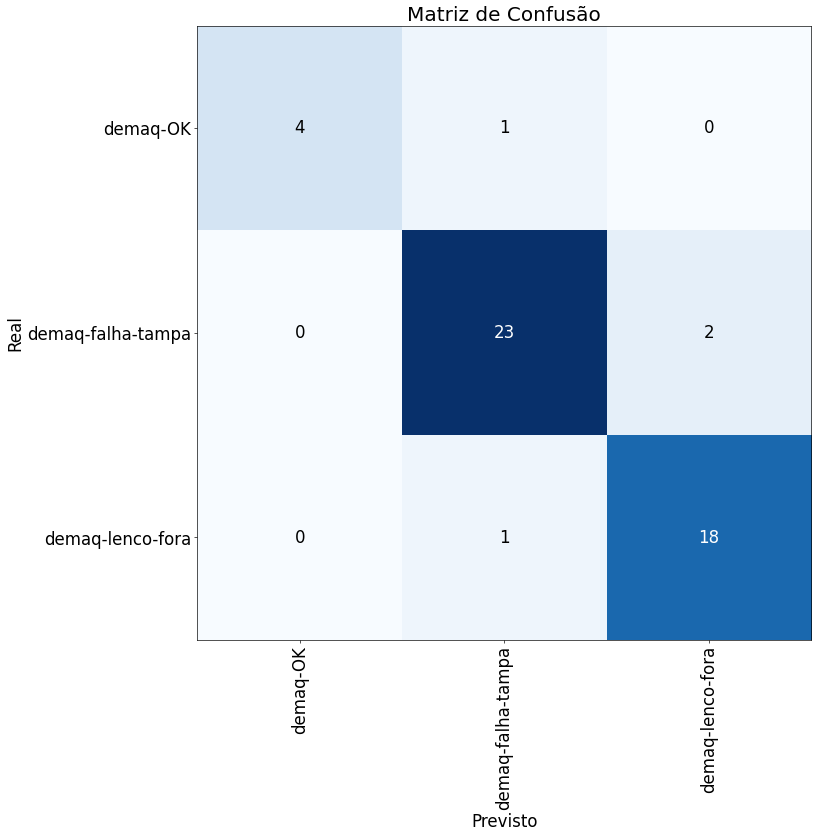

In [ ]:
interp101 = ClassificationInterpretation.from_learner(learn_resnet101)
interp101.plot_confusion_matrix(figsize=(14,14), dpi=60, title='Matriz de Confusão')
plt.ylabel('Real')
plt.xlabel('Previsto')
font = {'size': 40}
plt.rc('font', **font)

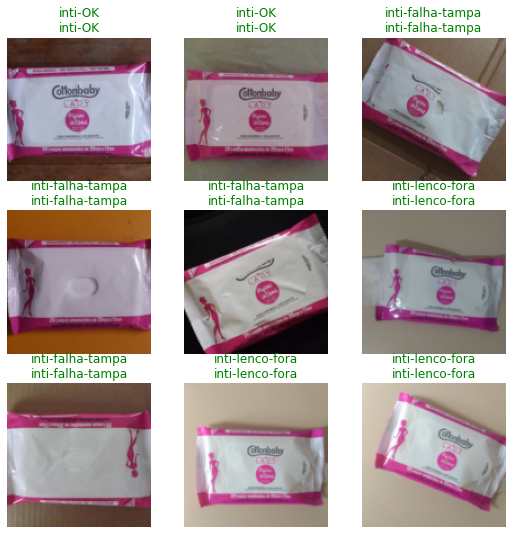

In [ ]:
learner_demaq.show_results()

# CNN Wipe


---




In [ ]:
#hide
#skip
! [ -e /content ] && pip install -Uqq fastai  # upgrade fastai on colab

     |████████████████████████████████| 189 kB 23.5 MB/s 
     |████████████████████████████████| 56 kB 4.3 MB/s 


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
from fastai.vision.all import *

In [ ]:
#path_demaq = Path('/content/drive/Shareddrives/TCC-domke/dataset/demaquilante')

#path_inti = Path('/content/drive/Shareddrives/TCC-domke/dataset/intimo')

path_wipe = Path('/content/drive/Shareddrives/TCC-domke/dataset/wipe-home')

In [ ]:
#files_demaq = get_image_files(path_demaq)
#len(files_demaq)

#files_inti = get_image_files(path_inti)
#len(files_inti)

files_wipe = get_image_files(path_wipe)
len(files_wipe)

171

In [ ]:
wipe = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items = get_image_files,
    splitter= RandomSplitter(valid_pct=0.3, seed=42),
    get_y= parent_label,
    item_tfms=Resize(128),
    batch_tfms=aug_transforms(max_rotate=30, pad_mode=PadMode.Zeros))

dls = wipe.dataloaders(path_wipe)
avg = 'macro'
metricas = [accuracy, Precision(average=avg), Recall(average=avg), F1Score(average=avg)]
len(dls.train_ds), len(dls.valid_ds)

/usr/local/lib/python3.7/dist-packages/torch/_tensor.py:1051: UserWarning: torch.solve is deprecated in favor of torch.linalg.solveand will be removed in a future PyTorch release.
torch.linalg.solve has its arguments reversed and does not return the LU factorization.
To get the LU factorization see torch.lu, which can be used with torch.lu_solve or torch.lu_unpack.
X = torch.solve(B, A).solution
should be replaced with
X = torch.linalg.solve(A, B) (Triggered internally at  ../aten/src/ATen/native/BatchLinearAlgebra.cpp:766.)
  ret = func(*args, **kwargs)


(120, 51)

In [ ]:
#dls.show_batch()

#  Treinamento Wipe

---



In [ ]:
#learn_resnet18 = cnn_learner(dls, resnet18, metrics=metricas)
#learn_resnet34 = cnn_learner(dls, resnet34, metrics=metricas)
#learn_resnet50 = cnn_learner(dls, resnet50, metrics=metricas)
learn_resnet101 = cnn_learner(dls, resnet101, metrics=metricas)

SuggestedLRs(valley=0.0006918309954926372)

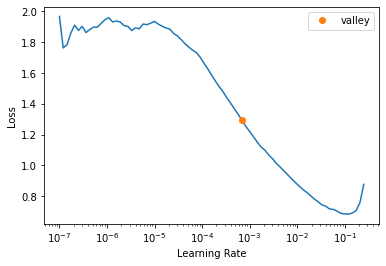

In [ ]:
#learn_resnet18.lr_find()
#learn_resnet34.lr_find()
#learn_resnet101.lr_find()

In [ ]:
#learn_resnet18.fine_tune(10, 0.0006)
#learn_resnet34.fine_tune(10, 0.06)
#learn_resnet50.fine_tune(10, 0.0006)
learn_resnet101.fine_tune(35, 0.0006)

epoch,train_loss,valid_loss,accuracy,precision_score,recall_score,f1_score,time
0,1.974314,2.278399,0.392157,0.462585,0.354167,0.225490,01:23


epoch,train_loss,valid_loss,accuracy,precision_score,recall_score,f1_score,time
0,1.825283,1.729166,0.411765,0.356974,0.375000,0.262095,00:50
1,1.820954,1.318392,0.372549,0.318681,0.346491,0.288356,00:50
2,1.674593,1.104454,0.470588,0.446873,0.457237,0.446529,00:49
3,1.567892,0.966473,0.509804,0.554612,0.512061,0.513388,00:49
4,1.438562,0.883772,0.549020,0.616564,0.563596,0.550520,00:50
5,1.371008,0.859326,0.607843,0.706093,0.632675,0.589263,00:50
6,1.243308,0.876023,0.666667,0.811111,0.695175,0.639240,00:50
7,1.163581,0.945851,0.705882,0.824837,0.736842,0.671058,00:50
8,1.080369,0.983148,0.686275,0.819102,0.719298,0.641092,00:49
9,1.009110,0.976411,0.686275,0.807407,0.719298,0.636519,00:48


KeyboardInterrupt: ignored

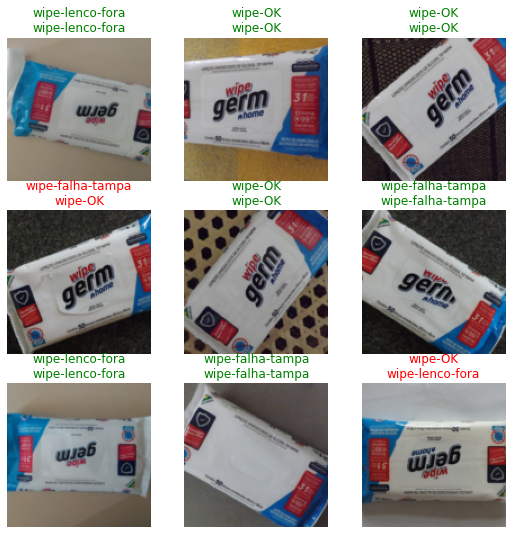

In [ ]:
learn_resnet101.show_results()

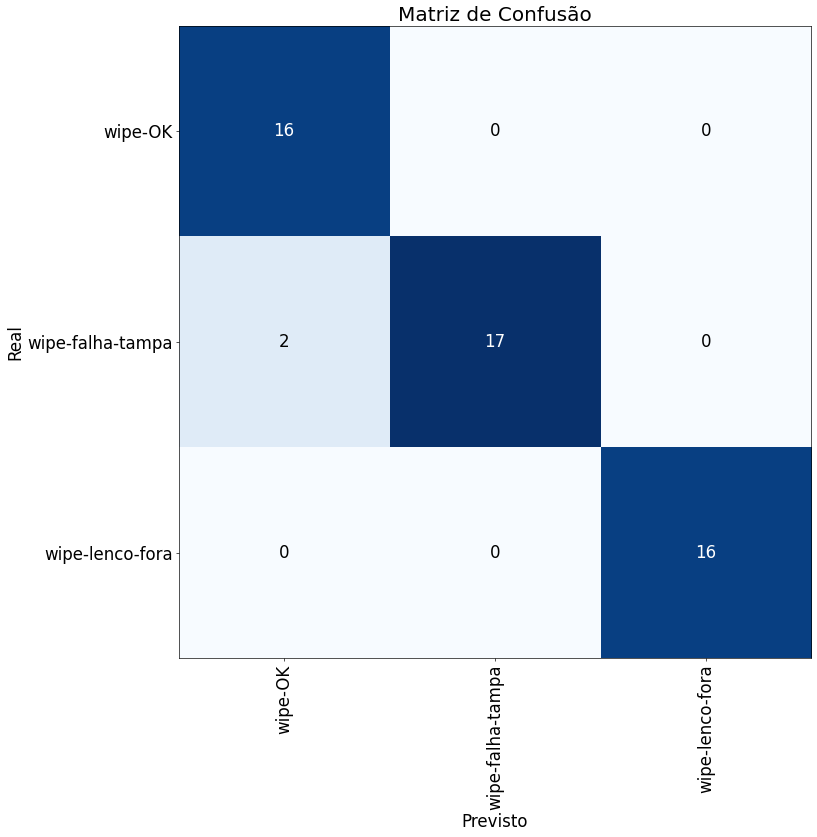

In [ ]:
interp101 = ClassificationInterpretation.from_learner(learn_resnet101)
interp101.plot_confusion_matrix(figsize=(14,14), dpi=60, title='Matriz de Confusão')
plt.ylabel('Real')
plt.xlabel('Previsto')
font = {'size': 20}
plt.rc('font', **font)



## ---



In [ ]:
learn_resnet101.export('/content/drive/Shareddrives/TCC-domke/dataset/models/learn101_wipe.pkl')

In [ ]:
learner_wipe = load_learner('/content/drive/Shareddrives/TCC-domke/dataset/models/learn101_wipe.pkl')
print('model is load!')
img_wipe1 = PILImage.create('/content/drive/Shareddrives/TCC-domke/dataset/wipe-home/wipe-lenco-fora/wipe-lenco-fora_3.jpg')
img_wipe2 = PILImage.create('/content/drive/Shareddrives/TCC-domke/dataset/wipe-home/wipe-lenco-fora/wipe-lenco-fora_10.jpg')
img_wipe3 = PILImage.create('/content/drive/Shareddrives/TCC-domke/dataset/wipe-home/wipe-lenco-fora/wipe-lenco-fora_12.jpg')
img_wipe4 = PILImage.create('/content/drive/Shareddrives/TCC-domke/dataset/wipe-home/wipe-falha-tampa/wipe-falha-tampa_4.jpg')
img_wipe5 = PILImage.create('/content/drive/Shareddrives/TCC-domke/dataset/wipe-home/wipe-falha-tampa/wipe-falha-tampa_7.jpg')
img_wipe6 = PILImage.create('/content/drive/Shareddrives/TCC-domke/dataset/wipe-home/wipe-falha-tampa/wipe-falha-tampa_14.jpg')
img_wipe7 = PILImage.create('/content/drive/Shareddrives/TCC-domke/dataset/wipe-home/wipe-OK/wipe-OK_2.jpg')
img_wipe8 = PILImage.create('/content/drive/Shareddrives/TCC-domke/dataset/wipe-home/wipe-OK/wipe-OK_9.jpg')
img_wipe9 = PILImage.create('/content/drive/Shareddrives/TCC-domke/dataset/wipe-home/wipe-OK/wipe-OK_7.jpg')
img_wipe10 = PILImage.create('/content/drive/Shareddrives/TCC-domke/dataset/wipe-home/wipe-OK/wipe-OK_11.jpg')

model is load!


In [ ]:
learner_wipe.predict(img_wipe1),learner_wipe.predict(img_wipe2),learner_wipe.predict(img_wipe3),learner_wipe.predict(img_wipe4),learner_wipe.predict(img_wipe5),learner_wipe.predict(img_wipe6),learner_wipe.predict(img_wipe7),learner_wipe.predict(img_wipe8),learner_wipe.predict(img_wipe9),learner_wipe.predict(img_wipe10)

(('wipe-lenco-fora',
  TensorBase(2),
  TensorBase([9.5097e-08, 4.5448e-07, 1.0000e+00])),
 ('wipe-lenco-fora',
  TensorBase(2),
  TensorBase([1.6134e-07, 2.5140e-09, 1.0000e+00])),
 ('wipe-lenco-fora',
  TensorBase(2),
  TensorBase([3.1937e-05, 1.1344e-08, 9.9997e-01])),
 ('wipe-falha-tampa',
  TensorBase(1),
  TensorBase([1.6366e-06, 1.0000e+00, 2.6269e-06])),
 ('wipe-falha-tampa',
  TensorBase(1),
  TensorBase([2.8789e-05, 9.9995e-01, 2.2345e-05])),
 ('wipe-falha-tampa', TensorBase(1), TensorBase([0.0012, 0.9959, 0.0029])),
 ('wipe-OK', TensorBase(0), TensorBase([9.9987e-01, 1.0103e-04, 3.0845e-05])),
 ('wipe-OK', TensorBase(0), TensorBase([9.9999e-01, 4.5527e-07, 8.4905e-06])),
 ('wipe-OK', TensorBase(0), TensorBase([5.9803e-01, 3.4065e-04, 4.0163e-01])),
 ('wipe-OK', TensorBase(0), TensorBase([9.9177e-01, 4.3319e-04, 7.7973e-03])))

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


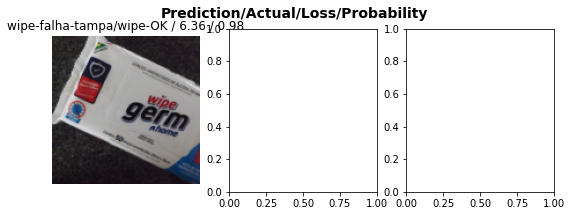

In [ ]:
wipe_dl = wipe.dataloaders(path_wipe)
learner_wipe = cnn_learner(wipe_dl, resnet101, metrics=metricas)
interp_wipe = ClassificationInterpretation.from_learner(learner_wipe)
interp_wipe.plot_top_losses(3)

In [ ]:
from fastai.vision.widgets import *

cleaner = ImageClassifierCleaner(learner_wipe)
cleaner

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


# Nova seção

---



In [ ]:
import os
 
def main():
   
    folder = "/content/drive/Shareddrives/TCC-domke/dataset/intimo/inti-lenco-fora"
    for count, filename in enumerate(os.listdir(folder)):
        dst = f"inti-lenco-fora_{str(count)}.jpg"
        src =f"{folder}/{filename}"  
        dst =f"{folder}/{dst}"

        os.rename(src, dst)
 

if __name__ == '__main__':
    main()

In [ ]:
path_qnt1 = Path('/content/drive/Shareddrives/TCC-domke/dataset/demaq/demaq-OK')
files_qnt = get_image_files(path_qnt1)
len(files_qnt)

30

In [ ]:
path_qnt2 = Path('/content/drive/Shareddrives/TCC-domke/dataset/demaq/demaq-falha-tampa')
files_qnt = get_image_files(path_qnt2)
len(files_qnt)

69

In [ ]:
path_qnt3 = Path('/content/drive/Shareddrives/TCC-domke/dataset/demaq/demaq-lenco-fora')
files_qnt = get_image_files(path_qnt3)
len(files_qnt)

68

In [ ]:
path_qnt4 = Path('/content/drive/Shareddrives/TCC-domke/dataset/intimo/inti-OK')
files_qnt4 = get_image_files(path_qnt4)

path_qnt5 = Path('/content/drive/Shareddrives/TCC-domke/dataset/intimo/inti-falha-tampa')
files_qnt5 = get_image_files(path_qnt5)

path_qnt6 = Path('/content/drive/Shareddrives/TCC-domke/dataset/intimo/inti-lenco-fora')
files_qnt6 = get_image_files(path_qnt6)

len(files_qnt4), len(files_qnt5), len(files_qnt6)

(20, 34, 37)

In [ ]:
path_qnt4 = Path('/content/drive/Shareddrives/TCC-domke/dataset/wipe-home/wipe-OK')
files_qnt4 = get_image_files(path_qnt4)

path_qnt5 = Path('/content/drive/Shareddrives/TCC-domke/dataset/wipe-home/wipe-falha-tampa')
files_qnt5 = get_image_files(path_qnt5)

path_qnt6 = Path('/content/drive/Shareddrives/TCC-domke/dataset/wipe-home/wipe-lenco-fora')
files_qnt6 = get_image_files(path_qnt6)

len(files_qnt4), len(files_qnt5), len(files_qnt6)

(56, 62, 53)